### This notebook examines Puma 560 dynamics with the Robotics Toolbox (RTB) for Python - Update1. ###

In [1]:
""" Matplotlib imports
"""
import matplotlib
matplotlib.use('Qt4Agg')
%matplotlib notebook
import matplotlib.pyplot as plt  # needed to get current figure number using plt.gcf().number
from matplotlib import rc        # needed to set Matplotlib animation._repr_html_()
from PIL import Image            # needed to open images created by the RTB for MATLAB Octave variant

rc('animation', html='jshtml')   # Matplotlib animations will be HTML wrapped JavaScript

In [2]:
""" RBT for Python robot imports
"""
import _robot                 # use helper script to locate local RTB for Python robot module
from robot.plot import *      # needed to access robot plot module globals (i.e., rbplotAnims2D)
from robot.dynamics import *  # needed for fdyn() function
from robot.puma560 import *   # needed for robot puma560 model data

Using Robotics Toolbox module /home/garyd/PycharmProjects/robotics-toolbox-python/notebooks/dynamics3d/../../robot
Creating a Puma 560 (std) as p560


With gravity load and no friction, calculate forward dynamics of the Puma 560 starting at rest from its zero angle pose for a duration of one second.

In [3]:
tic()
[t, q, qd] = fdyn(p560.nofriction(), 0.0, 1.0)
print("%s" % toc())

Elapsed time is 17.52724 seconds.


/usr/lib/python3/dist-packages/scipy/integrate/odepack.py:221: ODEintWarning: Integration successful.
  warnings.warn(warning_msg, ODEintWarning)


Run the same case using the RTB for MATLAB Octave variant to create and save plots for comparison with RTB for Python.

In [4]:
import os.path
if not os.path.isfile("./octave_fdyn3d_plot.jpg"):
    from os import system
    system("/usr/bin/octave ./octave_dyn3d.m")

<IPython.core.display.Javascript object>


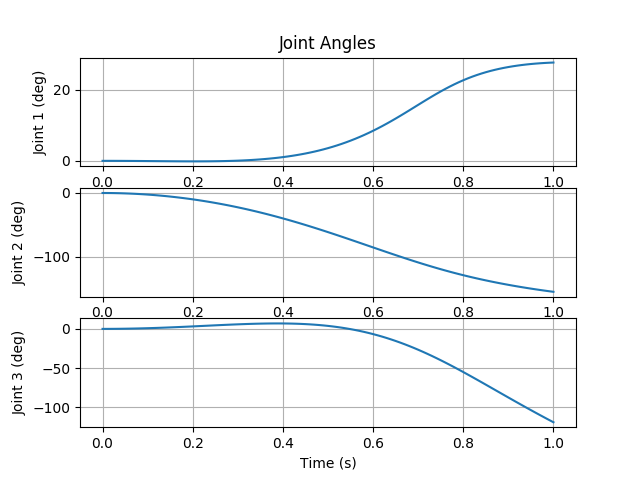

Text(0, 0.5, 'Joint 3 (deg)')

In [5]:
# Create and display joint angle time history plots for the first three joints of the Puma 560 manipulator.
figure(1)
subplot(3,1,1)
plot(t,q[:,0]*180/pi)
grid(True)
title("Joint Angles")
xlabel('Time (s)')
ylabel('Joint 1 (deg)')
subplot(3,1,2)
plot(t,q[:,1]*180/pi)
grid(True)
xlabel('Time (s)')
ylabel('Joint 2 (deg)')
subplot(3,1,3)
plot(t,q[:,2]*180/pi)
grid(True)
xlabel('Time (s)')
ylabel('Joint 3 (deg)')

<IPython.core.display.Javascript object>


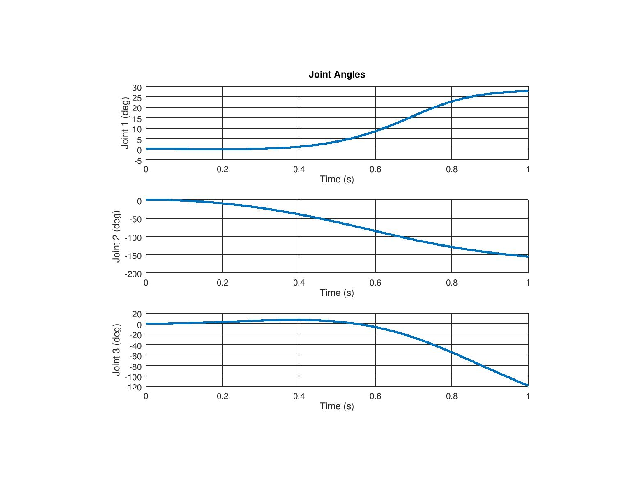

In [6]:
# Display the same joint angle time history plots created by the RTB for MATLAB Octave variant.
if os.path.isfile("./octave_fdyn3d_plot.jpg"):
    figure()  # create new figure
    im  = Image.open("octave_fdyn3d_plot.jpg", "r")
    imshow(im)
    axis('off')

Now use rbplot() to display an animation of the Puma 560 over the forward dynamics integraton period. In Jupyter nbviewer this plot will only show the final pose. Note: do not close this interactive plot figure until the last cell of this notebook has been run to create the controlled animation.

<IPython.core.display.Javascript object>


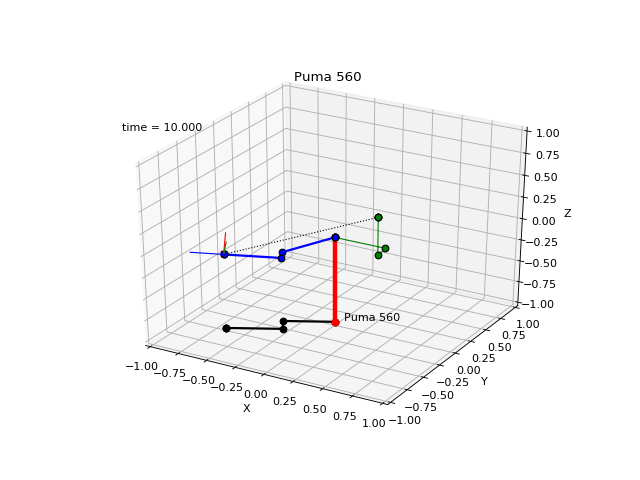

fignum = 3


In [7]:
rbplot(p560, q)            # rbplot() creates a Matplotlib animation 3D object and saves a handle to it in the 
fignum = plt.gcf().number  # rbplotAnims3D dictionary using the animator's managed figure number as keyword.
print("fignum = %d" % fignum)

<IPython.core.display.Javascript object>


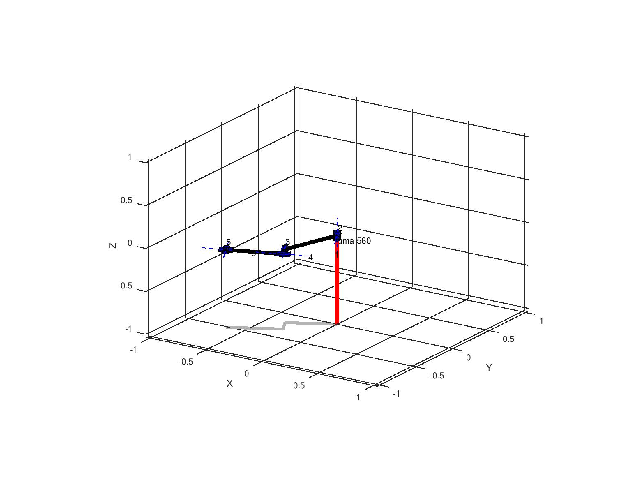

In [8]:
# Display plot of final Puma 560 pose from animation created by the RTB for MATLAB Octave variant.
# Note: image displayed below was created by running octave_fdyn3d.m within the Octave GUI, then
# using the figure rotation feature to adjust the view orientation before saving the final frame
# as a JPEG file.
if os.path.isfile("./octave_fdyn3d_anim.jpg"):
    figure()  # create new figure
    im  = Image.open("octave_fdyn3d_anim.jpg", "r")
    imshow(im)
    axis('off')

In [9]:
# Display the RTB for Python rbplot() animation of the Puma 560 as a controlled animation.
rbplotAnims3D[fignum]